# Computer Vision 2024/2025

## Deep Learning Approach for Chessboard Piece Recognition

**Authors:**  
- Adriano Machado (202105352)  
- Félix Martins (202108837)
- Francisco da Ana (202108762)  
- João Pereira (202108848)

## Overview

This notebook presents a deep learning computer vision pipeline for **Task 3: Bounding Box Detection and Digital Twin Extraction**. We use the ChessRed dataset and use a combination of deep learning models from PyTorch and Ultralytics to solve this complex problem. We followed the dataset's original train/val/test splits. Models were compared on the validation set, with the best ones evaluated on the test set for consistency.



In [ ]:
!pip install chess cairosvg
!pip install ultralytics

import chess
import chess.svg
import matplotlib.pyplot as plt
from PIL import Image
from IPython.display import SVG, display
import io
import cairosvg
from ultralytics import YOLO
import torch
import torch.nn as nn
from torchvision import models, transforms
from editdistance import eval as edit_distance

### Bounding Box Detection with YOLO
To identify and locate each chess piece, an object detection and classification model was needed. We selected the YOLO (You Only Look Once) architecture for this task, utilizing the Ultralytics framework due to its user-friendly interface for both training and inference.

Several YOLO variants were trained and compared, including YOLOv8n, YOLOv8x, and YOLO-L1s, to determine the most effective model for our pipeline.

Each model was trained for 100 epochs, and their performance was evaluated using the mean Average Precision (mAP) metric. This comparative analysis enabled us to select the best-performing model as the foundation for our digital twin extraction system.




In [ ]:
model = YOLO('yolov8n.pt')

# Training the model
model.train(data='path/to/dataset.yaml', epochs=100, imgsz=640)

# Predicting on an image
results = model('path/to/image.jpg')

**Dataset Preparation**

The dataset needed to be structured in a format compatible with the Ultralytics framework. This includes image files, corresponding label files (`.txt`) with bounding box coordinates and class IDs for each image, and a `.yaml` file that defines the dataset structure (e.g., paths, class names).

To achieve this, we created a script to parse the original annotations and organize the data accordingly.

The resulting directory structure was as follows:

```
├── images/
│   ├── 00/
│   ├── ...
│   └── 99/
├── labels/
│   ├── 00/
│   ├── ...
│   └── 99/
├── splits/
│   ├── train.txt
│   ├── val.txt
│   └── test.txt
├── dataset.yaml
```

In [ ]:
import os
import json

# === Paths ===
ANNOTATION_PATH = 'complete_dataset/annotations.json'
LABELS_DIR = 'complete_dataset/labels'

# === Load annotation ===
with open(ANNOTATION_PATH, 'r') as f:
    data = json.load(f)

images = {img['id']: img for img in data['images']}
annotations = data['annotations']['pieces']

# === Build image_id to annotations map ===
ann_by_image = {}
for ann in annotations:
    if len(ann.keys()) < 5:
        continue  

    img_id = ann['image_id']
    ann_by_image.setdefault(img_id, []).append(ann)

category_freq = {}

# === Create YOLO .txt label files ===
for img_id, image_info in images.items():
    path = image_info['path']  #
    width = image_info['width']
    height = image_info['height']
    base_name = path.replace(".jpg", ".txt")
    base_name = base_name.split("images/")[1]

    label_path = os.path.join(LABELS_DIR, base_name)

    os.makedirs(os.path.dirname(label_path), exist_ok=True)

    anns = ann_by_image.get(img_id, [])

    with open(label_path, 'w') as f:
        for ann in anns:
            x, y, w, h = ann['bbox']
            class_id = ann['category_id']
            category_freq[class_id] = category_freq.get(class_id, 0) + 1

            # Convert to YOLO format (normalized)
            x_center = (x + w / 2) / width
            y_center = (y + h / 2) / height
            w /= width
            h /= height

            f.write(f"{class_id} {x_center:.6f} {y_center:.6f} {w:.6f} {h:.6f}\n")

# === Print category stats ===
for category_id, freq in category_freq.items():
    print(f"Category {category_id}: {freq} occurrences")

# === Write split .txt files ===
SPLITS_DIR = 'complete_dataset/splits'
os.makedirs(SPLITS_DIR, exist_ok=True)

SPLITS = data['splits']['chessred2k']
image_id_to_file = {img['id']: img['path'] for img in data['images']}

for split in ['train', 'val', 'test']:
    ids = SPLITS[split]['image_ids']
    with open(f"{SPLITS_DIR}/{split}.txt", 'w') as f:
        for img_id in ids:
            fname = image_id_to_file.get(img_id)
            if fname:
                f.write(f"complete_dataset/{fname}\n")


**Training YOLO Models**
We trained several YOLO variants for 100 epochs to compare their performance.

Interestingly in all the models we trained, we found a breakthrough epoch (around 90) where the model abruptly decrease its loss value.

* **YOLOv8n**: The smallest and fastest model in the YOLOv8 family, designed for real-time applications with lower computational resources.
We trained this model freezing the backbone (10 initial layers), using batch size of 64 and an image size of 940 pixels.

In [ ]:
model = YOLO('yolov8n.pt')
model.train(
    data='/kaggle/input/chessboard-cv/data.yaml',
    epochs=100,
    imgsz=940,
    batch=64,
    freeze=10,
    name='myYolov8n'
)


* **YOLOv8x**: Is larger and more powerful model in the YOLOv8 family, designed for high accuracy tasks.
Because of its size, we reduce the batch size to 16 and image size to 640. For this model, we did not freeze any layers, allowing the model adapt its weights to the dataset.


In [ ]:
model = YOLO('yolov8x.pt')
model.train(
    data='/kaggle/input/chessboard-cv/data.yaml',
    epochs=100,
    imgsz=640,
    batch=16,
    name='myYolov8x'
)



* **Yolo-l1s**: A more recent model with significant improvements in architecture and performance.
We trained this model with an image size of 940 pixels and batch size of 16, because v11 is has a bigger architecture than the v8 and high batch size would lead to out of memory errors.


In [ ]:
model = YOLO('yolo11s.pt')
model.train(
    data='/kaggle/input/chessboard-cv/data.yaml',
    epochs=100,
    imgsz=940,
    batch=16,
    name='myYolo11n'
)


**Comparative Analysis**
We evaluated the models using mean Average Precision (mAP) at different IoU thresholds (mAP50 and mAP50-95) and a confusion matrix for classification performance.

| Model | mAP50 | mAP50-95 |
| :--- | :--- | :--- |
| **YOLOv8x** | **0.995** | **0.875** |
| YOLOv11s | 0.995 | 0.873 |
| YOLOv8n | 0.995 | 0.865 |


Based on the results, the **YOLOv8x** model performed the best, achieving `mAP50 = 0.995` and `mAP50-95 = 0.875`. It was therefore chosen for the subsequent steps of the pipeline.


| **YOLOv8x**                     | **YOLOv11s**                       | **YOLOv8n**                       |
| :-----------------------------: | :--------------------------------: | :-------------------------------: |
| 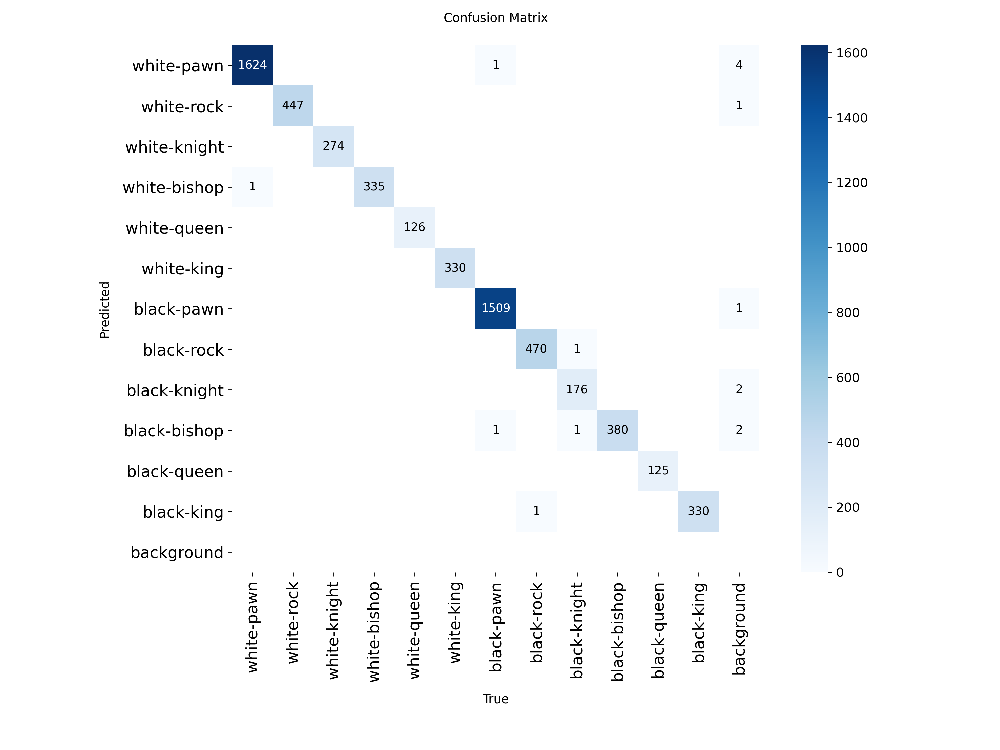 | 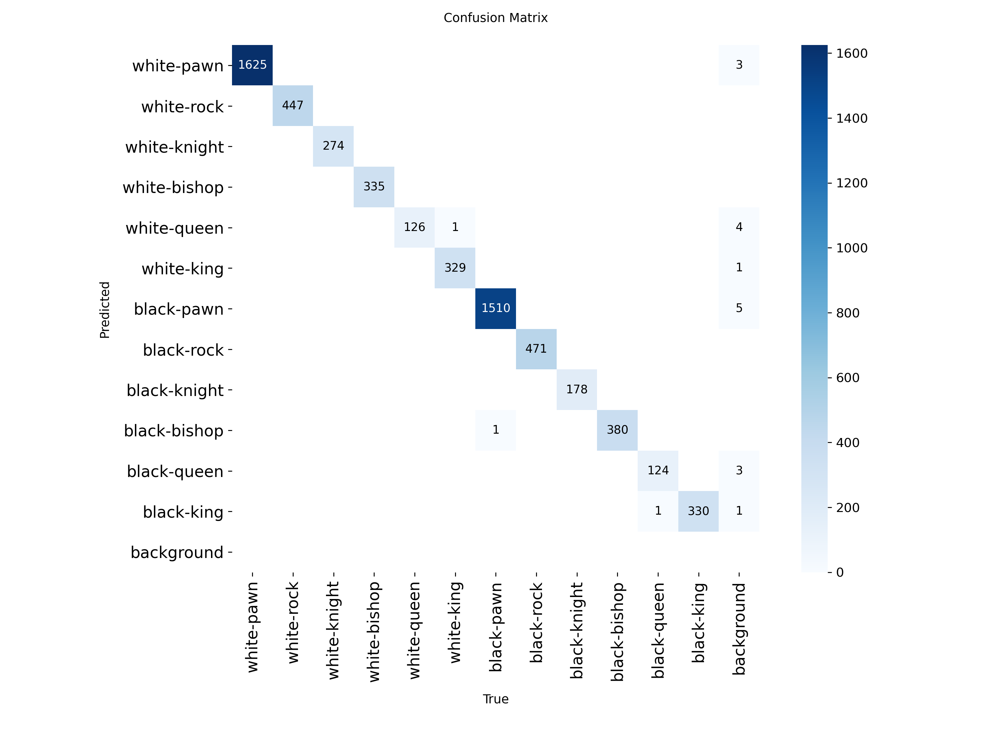 | 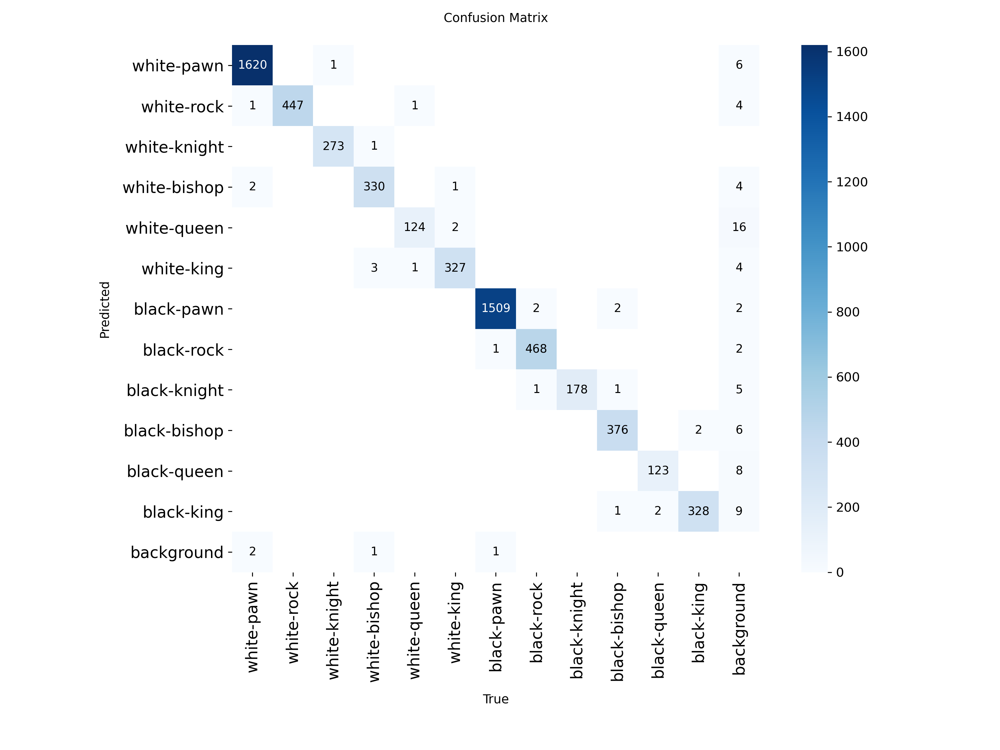 |



| **YOLOv8x**                     | **YOLOv11s**                       | **YOLOv8n**                       |
| :-----------------------------: | :--------------------------------: | :-------------------------------: |
| 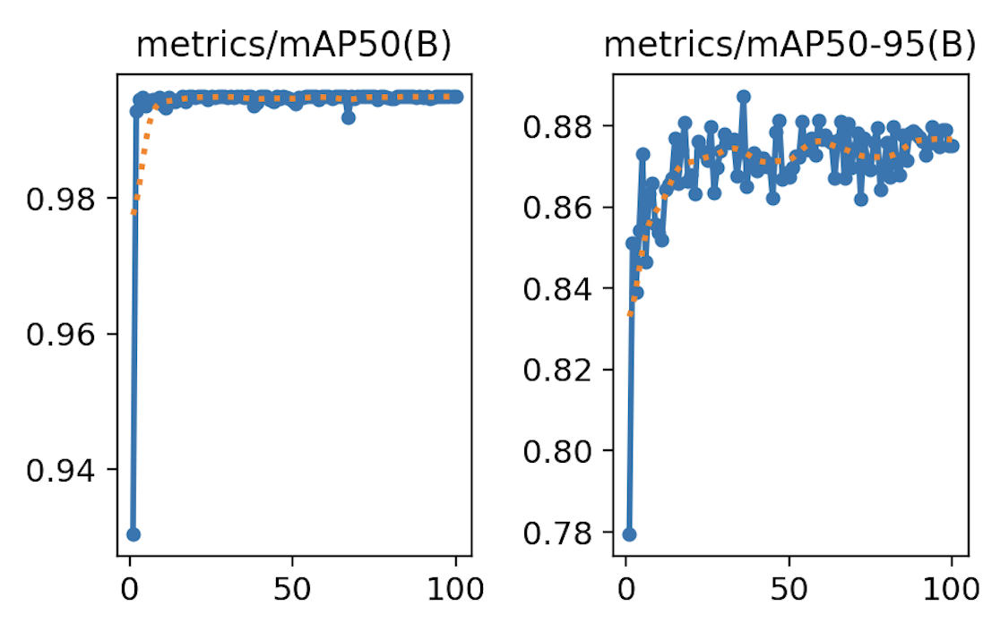 | 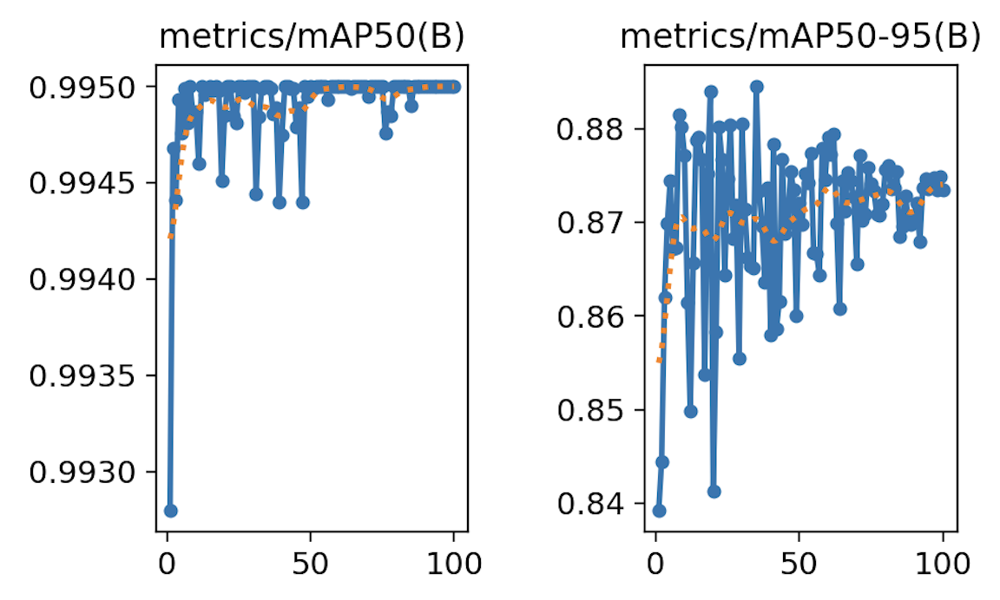 | 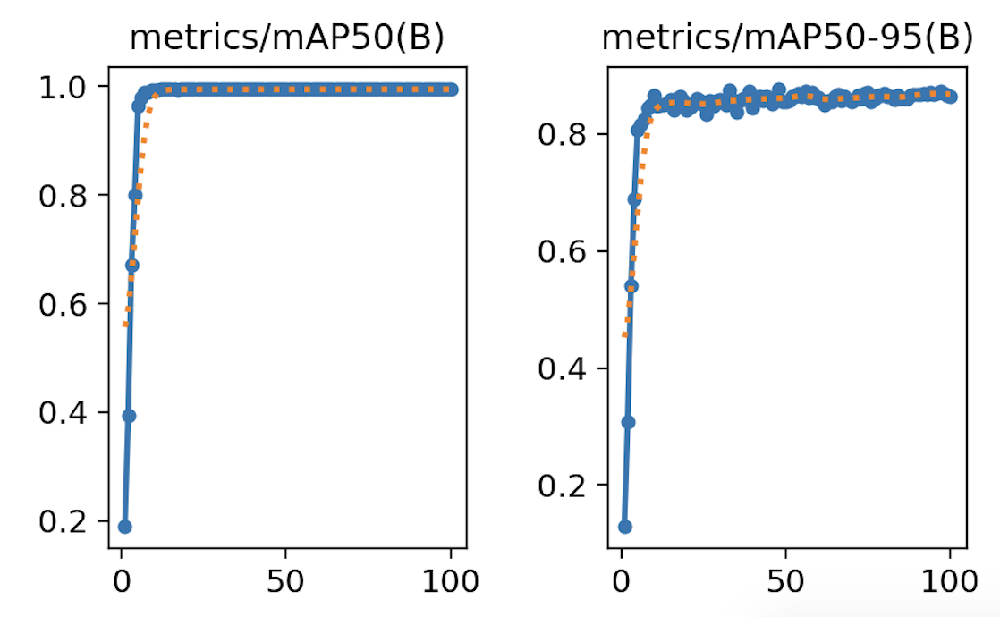 |



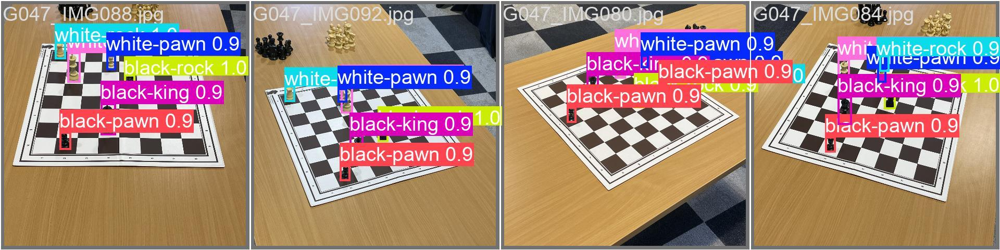

### The Digital Twin

A digital twin is a virtual representation of the physical chessboard. To describe the board state in a standardized text format, we use Forsyth-Edwards Notation (FEN). FEN is a single line of text that captures all the information needed to represent a particular chess position.

To visualize this digital twin, we used the *python-chess library*. This package can take a FEN string as input and generate a corresponding image of the board state.


In [ ]:

fen_string = "r2q1rk1/ppp1bppp/2p1b3/3n4/2N5/2NP3P/PPPB1PP1/R2Q2KR"
board = chess.Board(fen_string)
fen_svg = chess.svg.board(board=board)
png_data = cairosvg.svg2png(bytestring=fen_svg)
fen_image = Image.open(io.BytesIO(png_data))
actual_image = Image.open("dataset/images/56/G056_IMG023.jpg")

fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(actual_image)
axs[0].set_title("Actual Image")
axs[0].axis("off")
axs[1].imshow(fen_image)
axs[1].set_title("FEN Board")
axs[1].axis("off")
plt.tight_layout()
plt.show()

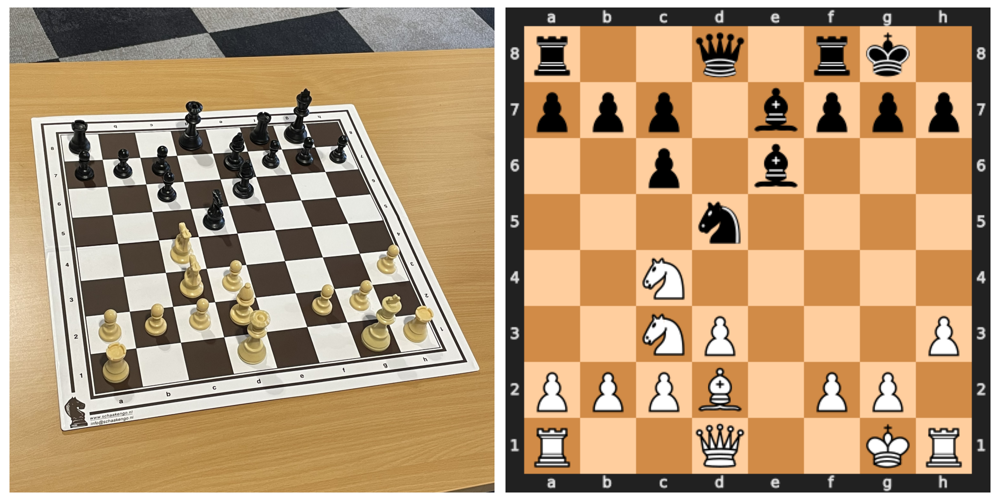

**Evaluation with Edit Distance**
To evaluate the accuracy of the digital twin, we compute the Levenshtein (edit) distance between the generated FEN string and the ground truth. This metric counts the minimum number of single-character edits (insertions, deletions, or substitutions) required to change one string into the other, giving us a measure of misplaced, incorrect, or missing pieces.


In [ ]:
FEN_MAP = {
    "white-pawn": "P", "white-rook": "R", "white-knight": "N", "white-bishop": "B", "white-queen": "Q", "white-king": "K",
    "black-pawn": "p", "black-rock": "r", "black-knight": "n", "black-bishop": "b", "black-queen": "q", "black-king": "k",
}

def matrix_to_fen(board_matrix):
    fen_rows = []
    for row in board_matrix:
        empty_count = 0
        fen_row = ""
        for cell in row:
            if cell == "*":
                empty_count += 1
            else:
                if empty_count > 0:
                    fen_row += str(empty_count)
                    empty_count = 0
                fen_row += cell
        if empty_count > 0:
            fen_row += str(empty_count)
        fen_rows.append(fen_row)
    return "/".join(fen_rows)

def get_ground_truth_fen(filepath, annotations_file='annotations_fen.json'):
    with open(annotations_file, 'r') as f:
        data = json.load(f)
    return data.get(str(filepath.split("/")[-1]), "")

def process_fen(board_matrix, filename):
    pred_fen = matrix_to_fen(board_matrix)
    exp_fen = get_ground_truth_fen(filename).split(' ')[0]
    pred_string = "".join("".join(row) for row in board_matrix)

    exp_string_full = ""
    for char in exp_fen.replace('/', ''):
        if char.isdigit():
            exp_string_full += '*' * int(char)
        else:
            exp_string_full += char

    edit_dist = edit_distance(pred_string, exp_string_full)
    return {"pred_fen": pred_fen, "exp_fen": exp_fen, "edit_dist": edit_dist}


#### Digital Twin Pipeline

Initially adopted an **end-to-end board recognition strategy**, inspired by the ChessReD paper. This method involved classifying each square of the board using a fully connected layer trained with a cross-entropy loss function. An alternative approach using semantic segmentation for the board squares was also explored but failed to achieve adequate performance.

However, the primary end-to-end method delivered poor results. While it performed reasonably well on common chess positions, its accuracy dropped significantly on more complex or unconventional board states.

The loss curve and a few examples demonstrating these performance issues are shown below:

[TODO: Add Plots]

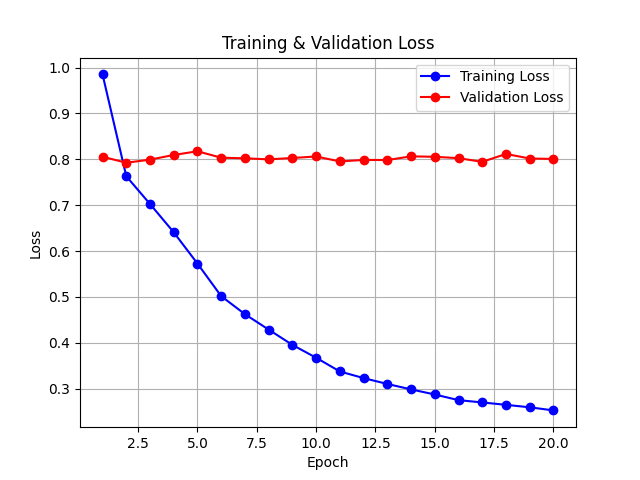

| 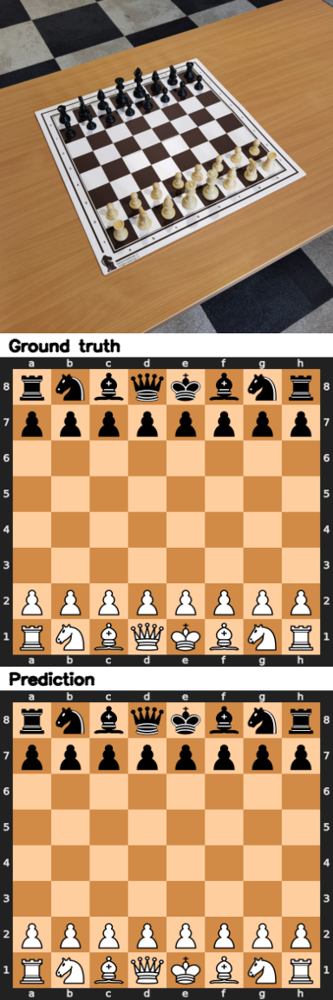 | 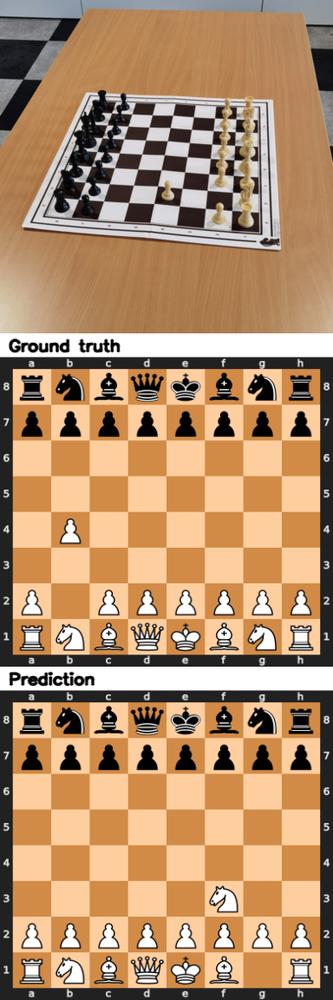 |

Given these limitations, we changed our approach to use the YOLO object detection model and use the resulting bounding box detections to reconstruct the board state. This new pipeline allows us to build a digital twin of the chessboard by mapping the detected pieces to their corresponding grid positions.

The mapping process is based on a key assumption: the central pixel of the bounding box's lower half will always fall within the correct square. For each detected piece, we calculate this representative point and identify which grid cell contains the transformed point and place the piece's corresponding character into an 8x8 matrix.



In [ ]:
def map_pieces_to_board(yolo_result, intersections, warp_matrix, fen_map):
    board_matrix = [["*" for _ in range(8)] for _ in range(8)]
    if not intersections:
        print("No intersections provided, cannot map pieces.")
        return board_matrix

    piece_boxes = yolo_result.boxes.xyxy.cpu().numpy()
    piece_classes = yolo_result.boxes.cls.cpu().numpy().astype(int)
    class_names = yolo_result.names

    grid_side_len = int(math.sqrt(len(intersections)))

    for i in range(len(piece_boxes)):
        box = piece_boxes[i]
        x1, y1, x2, y2 = box

        xb = (x1 + x2) / 2
        yb = y1 * 0.1 + y2 * 0.9

        point_to_transform = np.array([[[xb, yb]]], dtype=np.float32)
        transformed_point = cv2.perspectiveTransform(point_to_transform, warp_matrix)
        tx, ty = transformed_point[0][0]

        found_square = False
        for r in range(8):
            for c in range(8):
                top_left_idx = r * grid_side_len + c
                top_right_idx = top_left_idx + 1
                bottom_left_idx = (r + 1) * grid_side_len + c

                if (intersections[top_left_idx][0] < tx < intersections[top_right_idx][0] and
                    intersections[top_left_idx][1] < ty < intersections[bottom_left_idx][1]):

                    class_name = class_names[piece_classes[i]]
                    fen_char = fen_map.get(class_name)

                    if fen_char:
                        board_matrix[r][c] = fen_char

                    found_square = True
                    break
            if found_square:
                break

    return board_matrix



## Approaches to Board Recognition

The success of the digital twin pipeline is critically dependent on the accurate detection of the chessboard's corners and orientation. Our initial analysis showed that failures in this step were the primary cause of errors in the final board representation. To address this challenge, we moved beyond traditional computer vision methods and explored several deep learning-based strategies specifically aimed at extracting this information from the images.

The figure below provides a clear overview of the components used in each of our five strategies.


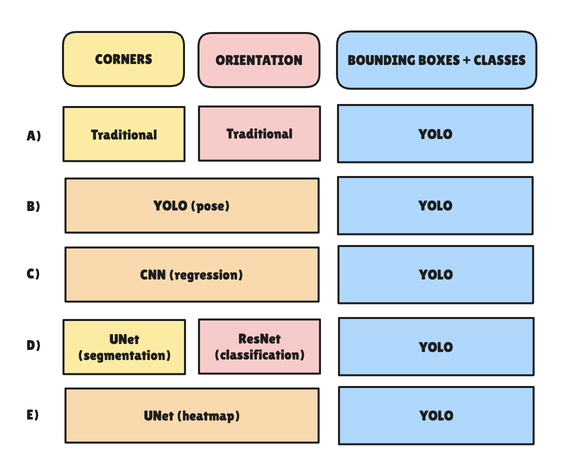
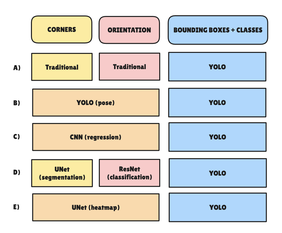

### Approach A: Traditional CV + YOLO
Our initial approach combined the YOLO model for piece detection with traditional computer vision techniques for identifying the board's geometry that we applied for **task 1**.

This method uses classical algorithms like **Canny edge detection**, **polygon approximation**, and **feature matching** to find the corners of our board. The code and information about this first method can be further explored in the report for task 1.

For orientation detection, we used template matching. An image of the horse logo was compared against the four corner regions of the input image, and the corner with the highest match score was used to determine the correct board rotation.

In [ ]:
def find_orientation_by_horse(image):
    horse_path = "figures/horse.png"
    horse_img = cv2.imread(horse_path, cv2.IMREAD_GRAYSCALE)

    height, width = image.shape
    corner_size = min(width, height) // 4

    corners = {
        "top_left": (image[:corner_size, :corner_size], cv2.rotate(horse_img, cv2.ROTATE_90_CLOCKWISE)),
        "top_right": (image[:corner_size, width-corner_size:], cv2.rotate(horse_img, cv2.ROTATE_180)),
        "bottom_left": (image[height-corner_size:, :corner_size], horse_img),
        "bottom_right": (image[height-corner_size:, width-corner_size:], cv2.rotate(horse_img, cv2.ROTATE_90_COUNTERCLOCKWISE)),
    }

    best_score = -1
    best_match_loc = None
    best_rotation = None

    for corner_name, (corner_img, horse_template) in corners.items():
        target_size = corner_size // 4
        resized_template = cv2.resize(horse_template, (target_size, target_size))

        if corner_img.shape[0] < resized_template.shape[0] or corner_img.shape[1] < resized_template.shape[1]:
            continue

        result = cv2.matchTemplate(corner_img, resized_template, cv2.TM_CCOEFF_NORMED)
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)

        if max_val > best_score:
            best_score = max_val

            if corner_name == "top_left":
                match_x, match_y = max_loc
                best_rotation = cv2.ROTATE_90_COUNTERCLOCKWISE
            elif corner_name == "top_right":
                match_x, match_y = width - corner_size + max_loc[0], max_loc[1]
                best_rotation = cv2.ROTATE_180
            elif corner_name == "bottom_left":
                match_x, match_y = max_loc[0], height - corner_size + max_loc[1]
                best_rotation = None
            elif corner_name == "bottom_right":
                match_x, match_y = width - corner_size + max_loc[0], height - corner_size + max_loc[1]
                best_rotation = cv2.ROTATE_90_CLOCKWISE

            best_match_loc = (match_x, match_y)

    return best_rotation, best_match_loc

The performance of this method declined substantially under occlusion or harsh lighting conditions, leading to the exploration of more advanced, learning-based methods.




### Approach B: YOLO Keypoint Detection + YOLO for Piece Detection


In this approach, we attempted to use YOLO's keypoint detection capabilities to directly identify the four corners of the chessboard. We trained a YOLOv11-pose model to detect a single "chessboard" object and locate its four corners—labeled "top_left," "top_right," "bottom_left," and "bottom_right"—as keypoints.

This approach was ultimately unsuccessful. The model struggled to converge on the precise pixel locations of the corners, leading to inconsistent and inaccurate keypoint detection. The visual results were poor, with predicted corners often misplaced, making this method unreliable for our pipeline.


In [ ]:
model = YOLO('yolo11s-pose.pt')
model.train(
    data='/kaggle/input/chessboard-corner-detect/data_corners_kp.yaml',
    epochs=100,
    imgsz=640,
    batch=64,
)


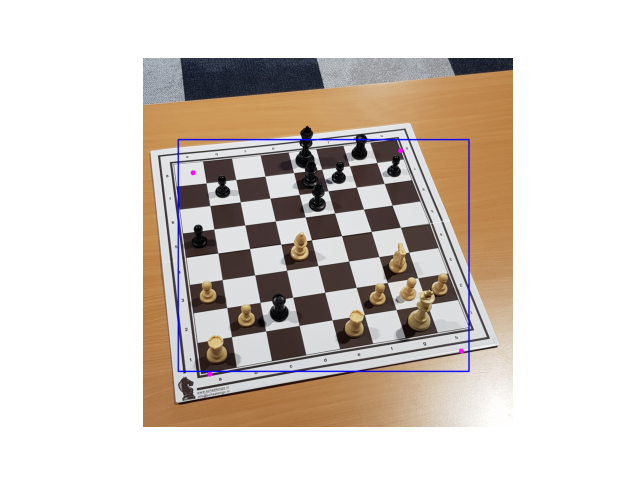

### Approach C: CNN (Regression) + YOLO for Piece Detection


Given the challenges with keypoint detection, we simplified the strategy by using a pre-trained CNN to directly regress the eight corner coordinates (x1, y1, ..., x4, y4).

Our first attempt used a ResNet50 backbone with its final layers replaced by a fully connected layer outputting eight values. We trained it using MSE loss and a sigmoid activation. After 50 epochs, the corner predictions were still unreliable, yielding results similar to the YOLO pose estimation model.

*(TODO: Add loss curve and prediction example image for ResNet50)*



We significantly improved this approach by:
1.  **Switching the backbone** to EfficientNetV2-S, which we had success with in Task 2.
2.  **Fine-tuning all layers** of the model instead of just the head.
3.  **Introducing manual data augmentations** to improve generalization, given the limited size of our dataset.

Since standard augmentation libraries often don't transform keypoint labels alongside the image, we used `torchvision` v0.23 (a pre-release version) which supports `tv_tensors.KeyPoints`. This allowed us to apply augmentations like random rotations, scaling, and perspective shifts while ensuring the corner coordinates were correctly transformed.

The complete code for this implementation is available in the `main.py` file, runnable by specifying the argument `--type corners`.

In [ ]:
def load_image(image_file: str):
    # Load with about 750x750 (3000 / 4)
    image = cv2.imread(image_file, cv2.IMREAD_REDUCED_COLOR_4)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

class ChessCornersDataset(Dataset):
    # A different dataset class because augmentations for corners require special care here
    # We use torchvision 0.23 (currently not stable) to be able to use tv_tensors.KeyPoints
    def __init__(self, root_dir, images_dir, partition, transform, use_2k_dataset=False):
        self.anns = json.load(open(os.path.join(root_dir, 'annotations.json')))
        self.categories = [c['name'] for c in self.anns['categories']]
        self.root = root_dir
        self.images_dir = images_dir
        self.ids = []
        self.file_names = []
        self.original_widths = []
        self.original_heights = []

        for x in self.anns['images']:
            self.file_names.append(x['path'])
            self.ids.append(x['id'])
            self.original_widths.append(x['width'])
            self.original_heights.append(x['height'])

        self.file_names = np.asarray(self.file_names)
        self.original_heights = np.asarray(self.original_heights)
        self.original_widths = np.asarray(self.original_widths)
        self.ids = np.asarray(self.ids)

        self.corners = torch.zeros((len(self.file_names), 4, 2), dtype=torch.float32)
        for corner_ann in self.anns['annotations']['corners']:
            corner_data = corner_ann['corners']
            for i, (corner_label, xyvalues) in enumerate(sorted(corner_data.items())):
                for coord in range(2):
                    self.corners[corner_ann['image_id']][i][coord] = xyvalues[coord]

        splits = self.anns["splits"]["chessred2k"] if use_2k_dataset else self.anns["splits"]
        if partition == 'train':
            self.split_ids = np.asarray(splits['train']['image_ids']).astype(int)
        elif partition == 'valid':
            self.split_ids = np.asarray(splits['val']['image_ids']).astype(int)
        else:
            self.split_ids = np.asarray(splits['test']['image_ids']).astype(int)

        intersect = np.isin(self.ids, self.split_ids)
        self.split_ids = np.where(intersect)[0]
        self.file_names = self.file_names[self.split_ids]
        self.corners = self.corners[self.split_ids]
        self.original_heights = self.original_heights[self.split_ids]
        self.original_widths = self.original_widths[self.split_ids]
        self.ids = self.ids[self.split_ids]

        self.transform = transform
        print(f"Number of {partition} images: {len(self.file_names)}")

    def __len__(self):
        return len(self.file_names)

    def __getitem__(self, i):
        image = load_image(os.path.join(self.images_dir, self.file_names[i]))

        original_width = self.original_widths[i]
        original_height = self.original_heights[i]
        h, w, _ = image.shape
        sx = w / original_width
        sy = h / original_height

        corners_scaled = self.corners[i].clone()
        corners_scaled[:, 0] *= sx
        corners_scaled[:, 1] *= sy

        image_chw = image.transpose((2, 0, 1))
        img_tv = tv_tensors.Image(image_chw)
        kps_tv = tv_tensors.KeyPoints(corners_scaled.unsqueeze(0), canvas_size=(h, w))  # requires torchvision 0.23

        img_transformed, kps_transformed = self.transform(img_tv, kps_tv)

        # Normalize to [0-1]
        _, final_h, final_w = img_transformed.shape
        kps_transformed[:,:,0] /= final_w
        kps_transformed[:,:,1] /= final_h

        final_corners = kps_transformed.squeeze(0)

        return img_transformed, final_corners

def calculate_corners_metric(all_preds, all_labels):
    # Mean Euclidean Distance between predicted and true corners
    # all_preds and all_labels are (N, 8) where N is batch_size, 8 is (x1,y1,x2,y2,x3,y3,x4,y4)
    # Reshape to (N, 4, 2)
    all_preds_reshaped = all_preds.view(-1, 4, 2)
    all_labels_reshaped = all_labels.view(-1, 4, 2)

    # Calculate Euclidean distance for each corner and then average
    distances = torch.sqrt(torch.sum((all_preds_reshaped - all_labels_reshaped)**2, dim=-1))
    mean_distance_per_corner = torch.mean(distances)
    return mean_distance_per_corner.item()

class CornersPredictor(nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model  # should predict: 4 corners * 2 coordinates (x, y)

    @staticmethod
    def create_efficient_net(pretrained: bool = True):
        weights = models.EfficientNet_V2_S_Weights.DEFAULT if pretrained else None
        conv_model = models.efficientnet_v2_s(weights=weights)
        conv_model.classifier[1] = nn.Linear(conv_model.classifier[1].in_features, out_features=8)
        return CornersPredictor(conv_model)

    def forward(self, x):
        corners = self.model(x)
        corners = torch.sigmoid(corners)
        return corners

def train_model_corners(
    # ...
):
    # Classic training function
    # ...
    pass

device = "cuda" if torch.cuda.is_available() else "cpu"

## Training process (inside a train function)
model = CornersPredictor.create_efficient_net(pretrained=True).to(device)
epochs = 200

loss_fn = nn.MSELoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

train_dataloader = ...
valid_dataloader = ...
model = train_model_corners(
    model,
    train_dataloader,
    valid_dataloader,
    optimizer,
    loss_fn,
    scheduler,
    device,
    epochs=epochs,
)


The results improved with a MED of 0.58% in the validation set and 0.45% in the test set.


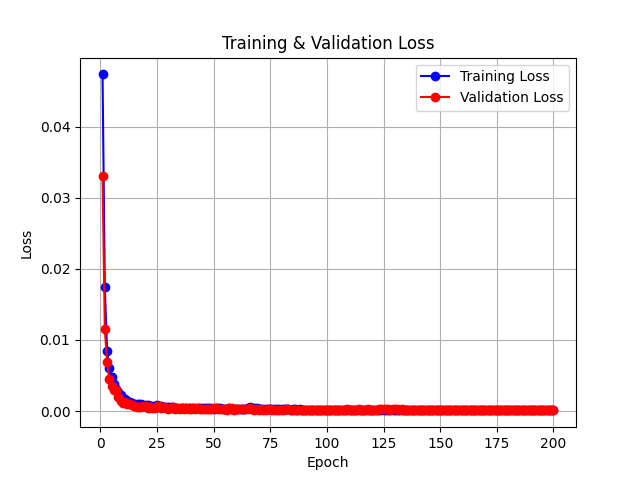

Examples of predictions before data augmentation:

| 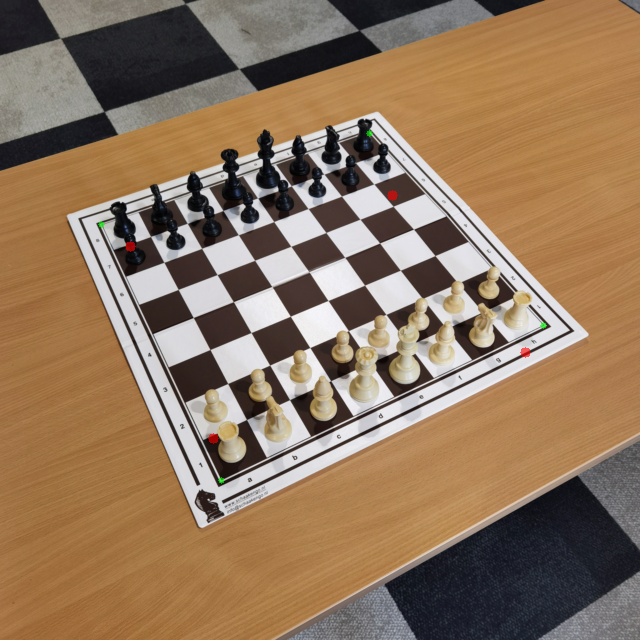 | 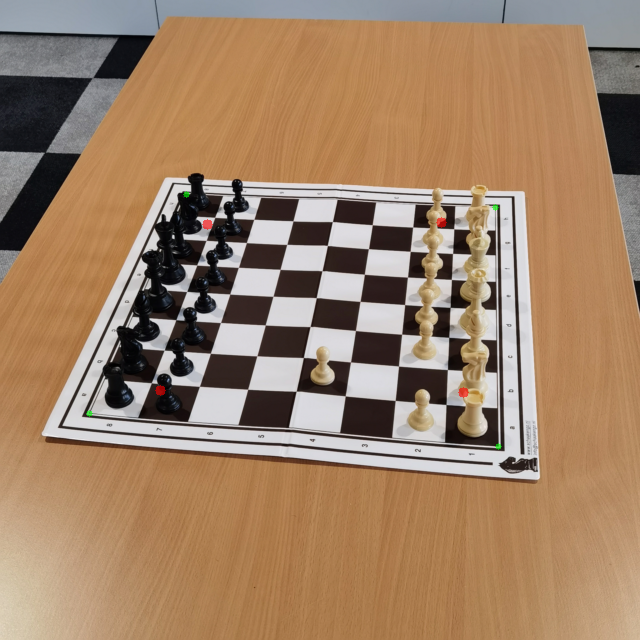 | 

After data augmentation:

| 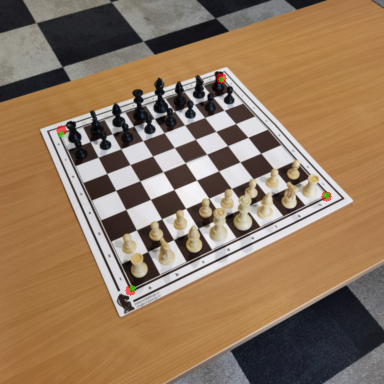 | 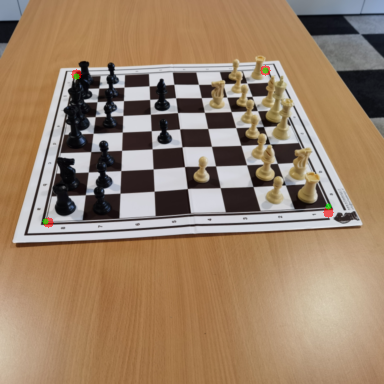 | 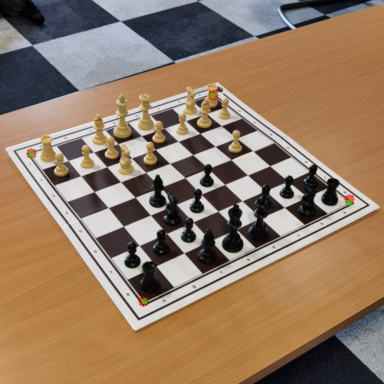 | 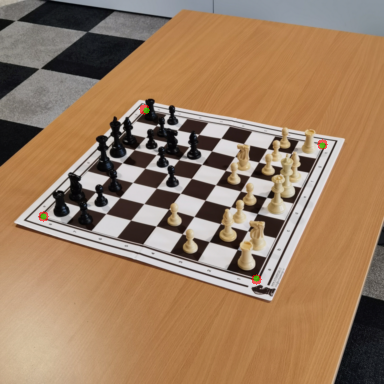 |


### Approach D: UNet (Segmentation) + ResNet (Classification) + YOLO for Piece Detection

In this approach,we developed a U-Net model to segment the chessboard from the background. From the resulting binary mask, we approximate a four-cornered polygon and extract the corner coordinates using traditional CV techniques.

In [ ]:
class UNet(nn.Module):
    def __init__(self):
        super().__init__()

        def conv_block(in_ch, out_ch):
            return nn.Sequential(
                nn.Conv2d(in_ch, out_ch, 3, padding=1),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_ch, out_ch, 3, padding=1),
                nn.ReLU(inplace=True)
            )

        self.encoder1 = conv_block(3, 64)
        self.encoder2 = conv_block(64, 128)
        self.encoder3 = conv_block(128, 256)
        self.encoder4 = conv_block(256, 512)

        self.pool = nn.MaxPool2d(2)

        self.bottleneck = conv_block(512, 1024)

        self.upconv4 = nn.ConvTranspose2d(1024, 512, 2, stride=2)
        self.decoder4 = conv_block(1024, 512)
        self.upconv3 = nn.ConvTranspose2d(512, 256, 2, stride=2)
        self.decoder3 = conv_block(512, 256)
        self.upconv2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.decoder2 = conv_block(256, 128)
        self.upconv1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.decoder1 = conv_block(128, 64)

        self.conv_last = nn.Conv2d(64, 1, 1)

    def forward(self, x):
        e1 = self.encoder1(x)
        e2 = self.encoder2(self.pool(e1))
        e3 = self.encoder3(self.pool(e2))
        e4 = self.encoder4(self.pool(e3))

        b = self.bottleneck(self.pool(e4))

        d4 = self.decoder4(torch.cat([self.upconv4(b), e4], dim=1))
        d3 = self.decoder3(torch.cat([self.upconv3(d4), e3], dim=1))
        d2 = self.decoder2(torch.cat([self.upconv2(d3), e2], dim=1))
        d1 = self.decoder1(torch.cat([self.upconv1(d2), e1], dim=1))

        return torch.sigmoid(self.conv_last(d1))



Because the segmentation mask provides no information about the board's orientation (which corner is which), we used a separate, ResNet-based model to classify the board's rotation. The orientation was treated as a 4-class classification problem (0°, 90°, 180°, 270°).

The corner annotations only include the internal corners of the board and exclude the horse logo used for orientation. Since we believe the logo provides valuable information for the model, we addressed this by supplying the classifier with images that included a sufficient margin around the chessboard, ensuring the horse logo was always visible.

```python
cl_model = models.resnet18(pretrained=True)
cl_model.fc = nn.Linear(cl_model.fc.in_features, 4)
```

| 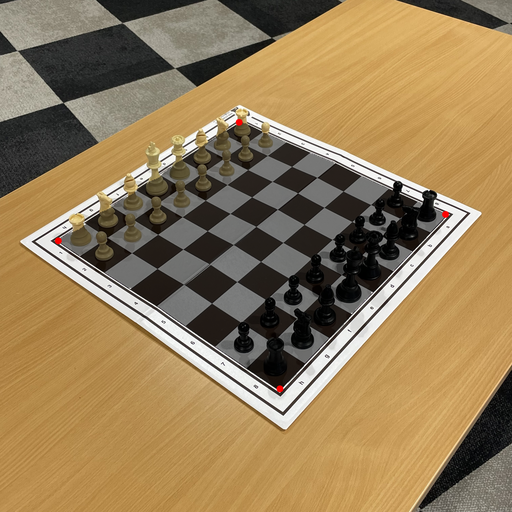 | 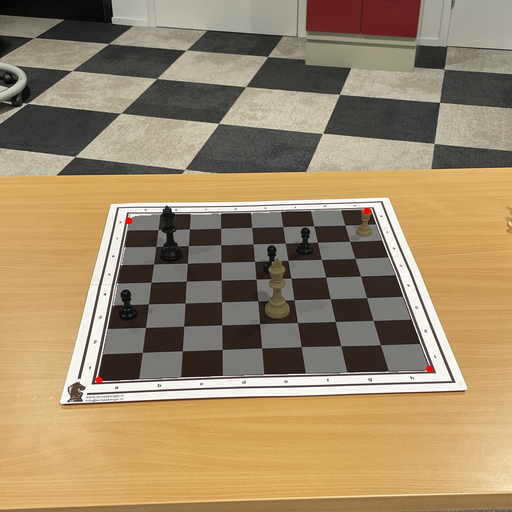 | 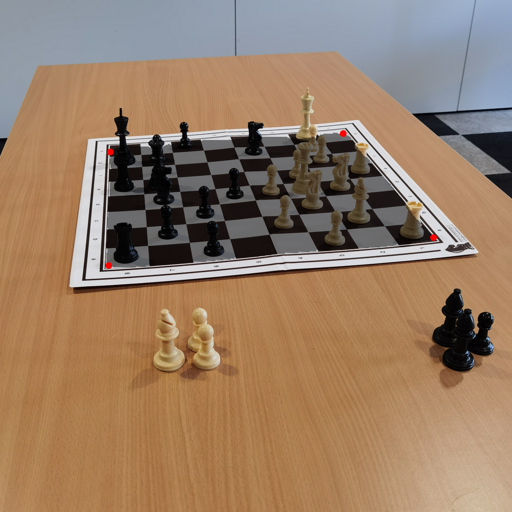 | 

### Approach E: UNet (Heatmap) + YOLO for Piece Detection

After struggling with the reliability of the other corner detection methods, we decided to try a different approach.

The key idea was to predict heatmaps rather than directly predicting corner coordinates.
A heatmap represents the probability distribution of where each corner might be located, brighter pixels indicate higher confidence that a corner exists at that position.
This approach is more robust because instead of forcing the model to output exact coordinates, it can express uncertainty and handle ambiguous cases.

We trained a U-Net model to output four separate heatmaps, one for each inner corner of the chessboard.
The encoder uses transfer learning from a pretrained ResNet34 (trained on ImageNet), while the decoder was trained from scratch.
The brightest point in each heatmap gives us the predicted corner location.



In [ ]:
class UNetWithResnetEncoder(nn.Module):
    """A U-Net model using a pretrained ResNet34 as the encoder for corner detection."""
    def __init__(self, n_class=4, pretrained=False):
        super().__init__()
        resnet = models.resnet34(weights=models.ResNet34_Weights.IMAGENET1K_V1 if pretrained else None)
        self.encoder1 = nn.Sequential(resnet.conv1, resnet.bn1, resnet.relu, resnet.maxpool)
        self.encoder2 = resnet.layer1
        self.encoder3 = resnet.layer2
        self.encoder4 = resnet.layer3
        self.encoder5 = resnet.layer4
        self.upconv4 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.decoder4 = nn.Sequential(nn.Conv2d(512, 256, 3, padding=1), nn.ReLU(), nn.Conv2d(256, 256, 3, padding=1), nn.ReLU())
        self.upconv3 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.decoder3 = nn.Sequential(nn.Conv2d(256, 128, 3, padding=1), nn.ReLU(), nn.Conv2d(128, 128, 3, padding=1), nn.ReLU())
        self.upconv2 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.decoder2 = nn.Sequential(nn.Conv2d(128, 64, 3, padding=1), nn.ReLU(), nn.Conv2d(64, 64, 3, padding=1), nn.ReLU())
        self.final_conv = nn.Conv2d(64, n_class, kernel_size=1)

    def forward(self, x):
        enc1 = self.encoder1(x); enc2 = self.encoder2(enc1); enc3 = self.encoder3(enc2)
        enc4 = self.encoder4(enc3); enc5 = self.encoder5(enc4)
        up4 = self.upconv4(enc5); dec4 = self.decoder4(torch.cat([up4, enc4], 1))
        up3 = self.upconv3(dec4); dec3 = self.decoder3(torch.cat([up3, enc3], 1))
        up2 = self.upconv2(dec3); dec2 = self.decoder2(torch.cat([up2, enc2], 1))
        return self.final_conv(dec2)

The UNet-based heatmap approach demonstrated significantly improved corner detection accuracy. The model successfully learned to generate distinct heatmaps with peak activations consistently aligning with the true corner locations. However, we still observed some limitations:

* **Corner Label Confusion:** While the heatmaps for the four corners were generally accurate, the model occasionally struggled with assigning the correct label (e.g., confusing the top-left corner with the bottom-right corner).
* **Sample Complexity:** The larger dataset didn't contained the annotations for the corners, we only had annotations for approximately 2,000 annotated images (which are then divided into train/test/val sets) which may have been insufficient for the model to generalize across all possible chessboard orientations and lighting conditions.


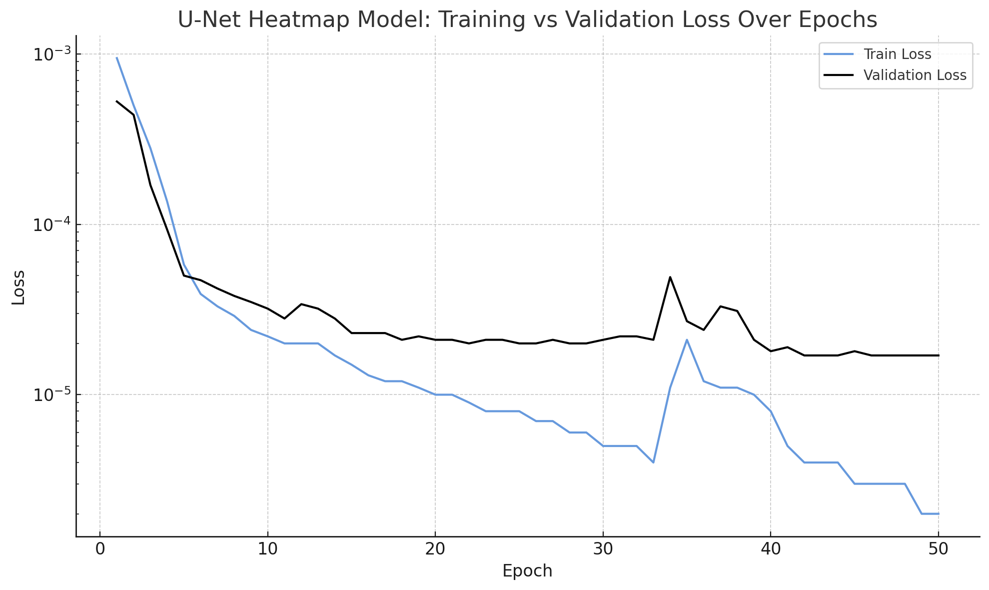 |

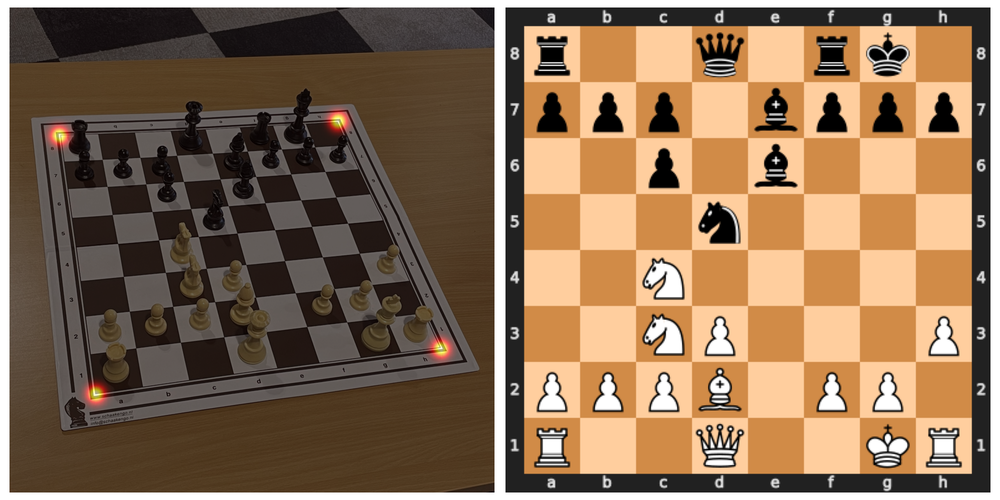

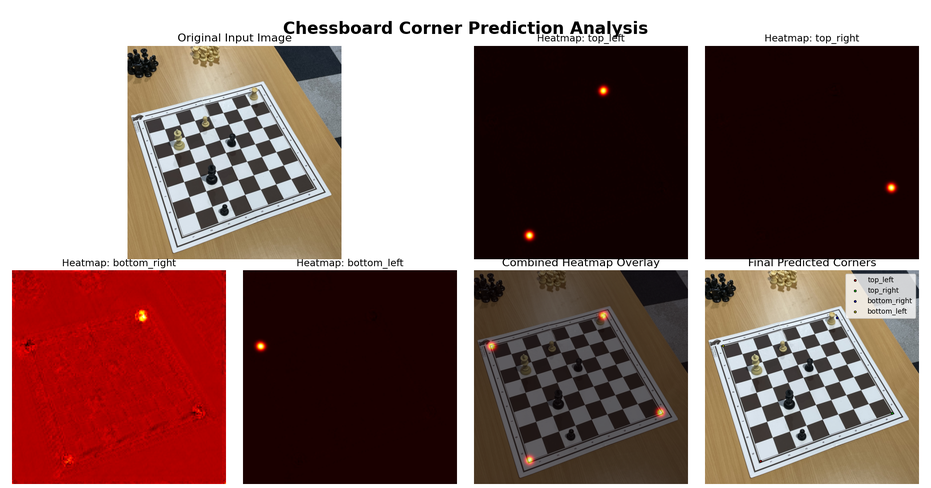

In the figure abolve we can see one case where the model had trouble distinguishing the top_left from the bottom_right leading to a bad prediction.



## Future Improvements

To address the remaining limitations, several future improvements could be explored:

* **Data Augmentation:** Employ more advanced data augmentation techniques, such as synthetic data generation or Generative Adversarial Networks (GANs), to increase the diversity and size of the training set. This would help the model generalize better to unseen conditions.
* **Orientation Detection:** Incorporate a dedicated orientation detection module to resolve corner labeling ambiguities. This could involve feature matching, as in our initial approach, or a small classification network trained to identify the board's rotation after the corners have been located via heatmaps.
* **Combined Model:** Explore an end-to-end model that simultaneously predicts corner heatmaps and board orientation, potentially leading to a more efficient and accurate pipeline.


## Conclusions

Our evaluation metrics were essential for diagnosing issues and guiding the development of a more robust digital twin extraction pipeline. The edit distance between predicted and ground truth FEN strings proved particularly insightful:

* **Low Edit Distance (e.g., 1-3):** This typically indicates a minor classification error by the YOLO model, where a single occluded or ambiguous piece was misidentified. This highlights that the pipeline's accuracy is ultimately bounded by the object detector's performance, which, while strong, is not perfect.
* **High Edit Distance (e.g., >40):** This signifies a catastrophic failure early in the pipeline, usually in corner detection. An inaccurate perspective warp matrix resulting from misplaced corners will cause nearly all pieces to be mapped to the wrong grid squares, leading to a completely incorrect FEN string.
* **Intermediate Edit Distance (e.g., >10):** This often points to an incorrect orientation detection. Since FEN representation is dependent on the board being oriented with the white player at the bottom, a rotational error will systematically misplace every piece, resulting in a significantly different but structured error pattern.

This iterative process, moving from traditional CV to regression, segmentation, and finally heatmap prediction, demonstrates the power of deep learning for solving complex computer vision problems.